In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.figsize']=(8,4)
plt.rcParams['figure.dpi']=400

In [2]:
df = pd.read_csv("D:\ExcelR_Assignments\Clustering\Datasets\EastWestAirlines.csv")
df

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [3]:
df.drop(columns='ID', inplace=True)
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
0,28143,0,1,1,1,174,1,0,0,7000,0
1,19244,0,1,1,1,215,2,0,0,6968,0
2,41354,0,1,1,1,4123,4,0,0,7034,0
3,14776,0,1,1,1,500,1,0,0,6952,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1
3995,64385,0,1,1,1,981,5,0,0,1395,1
3996,73597,0,3,1,1,25447,8,0,0,1402,1
3997,54899,0,1,1,1,500,1,500,1,1401,0


In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Balance,3999.0,73601.327582,100775.664958,0.0,18527.5,43097.0,92404.0,1704838.0
Qual_miles,3999.0,144.114529,773.663804,0.0,0.0,0.0,0.0,11148.0
cc1_miles,3999.0,2.059515,1.376919,1.0,1.0,1.0,3.0,5.0
cc2_miles,3999.0,1.014504,0.147650,1.0,1.0,1.0,1.0,3.0
cc3_miles,3999.0,1.012253,0.195241,1.0,1.0,1.0,1.0,5.0
Bonus_miles,3999.0,17144.846212,24150.967826,0.0,1250.0,7171.0,23800.5,263685.0
Bonus_trans,3999.0,11.601900,9.603810,0.0,3.0,12.0,17.0,86.0
Flight_miles_12mo,3999.0,460.055764,1400.209171,0.0,0.0,0.0,311.0,30817.0
Flight_trans_12,3999.0,1.373593,3.793172,0.0,0.0,0.0,1.0,53.0
Days_since_enroll,3999.0,4118.559390,2065.134540,2.0,2330.0,4096.0,5790.5,8296.0


In [5]:
df[df.duplicated()]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
3876,1000,0,1,1,1,0,0,0,0,1597,0


In [6]:
df.drop_duplicates(inplace=True)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3998 entries, 0 to 3998
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3998 non-null   int64
 1   Qual_miles         3998 non-null   int64
 2   cc1_miles          3998 non-null   int64
 3   cc2_miles          3998 non-null   int64
 4   cc3_miles          3998 non-null   int64
 5   Bonus_miles        3998 non-null   int64
 6   Bonus_trans        3998 non-null   int64
 7   Flight_miles_12mo  3998 non-null   int64
 8   Flight_trans_12    3998 non-null   int64
 9   Days_since_enroll  3998 non-null   int64
 10  Award              3998 non-null   int64
dtypes: int64(11)
memory usage: 374.8 KB


<Axes: xlabel='Balance'>

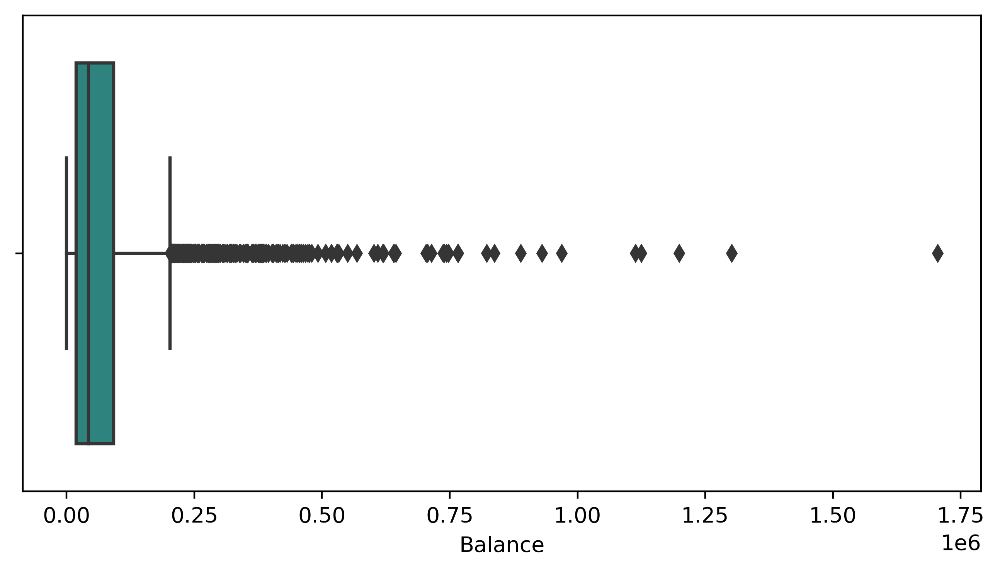

In [8]:
sns.boxplot(x=df['Balance'], orient='h', palette='viridis')

<Axes: xlabel='Bonus_miles'>

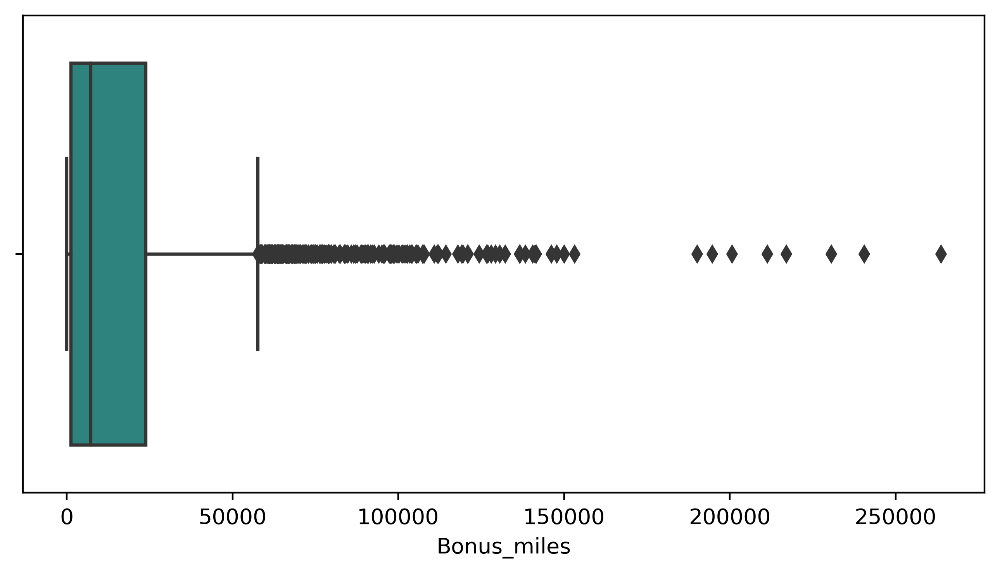

In [9]:
sns.boxplot(x=df['Bonus_miles'], orient='h',palette='viridis')

<Axes: xlabel='Bonus_trans'>

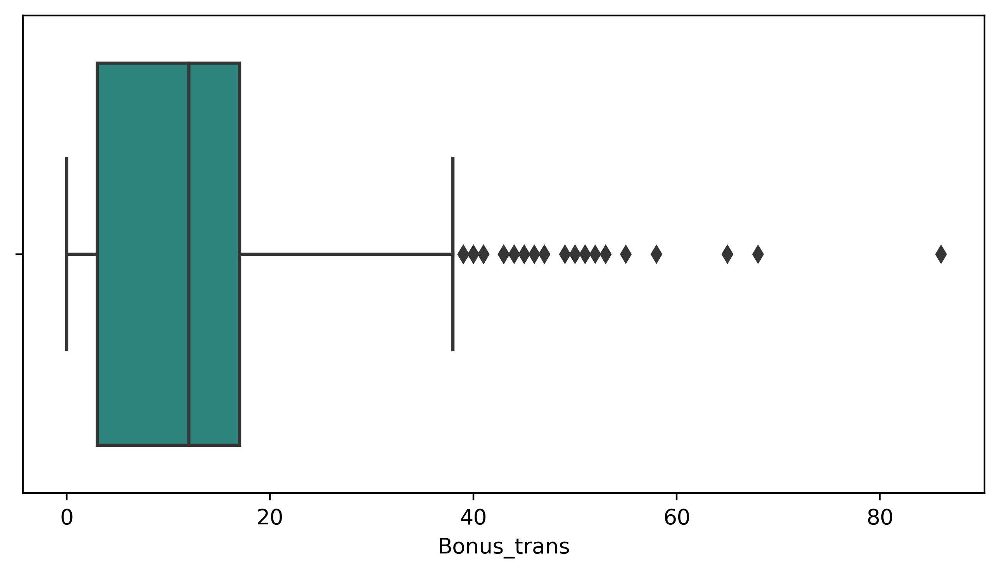

In [10]:
sns.boxplot(x=df['Bonus_trans'], orient='h', palette='viridis')

<Axes: xlabel='Flight_miles_12mo'>

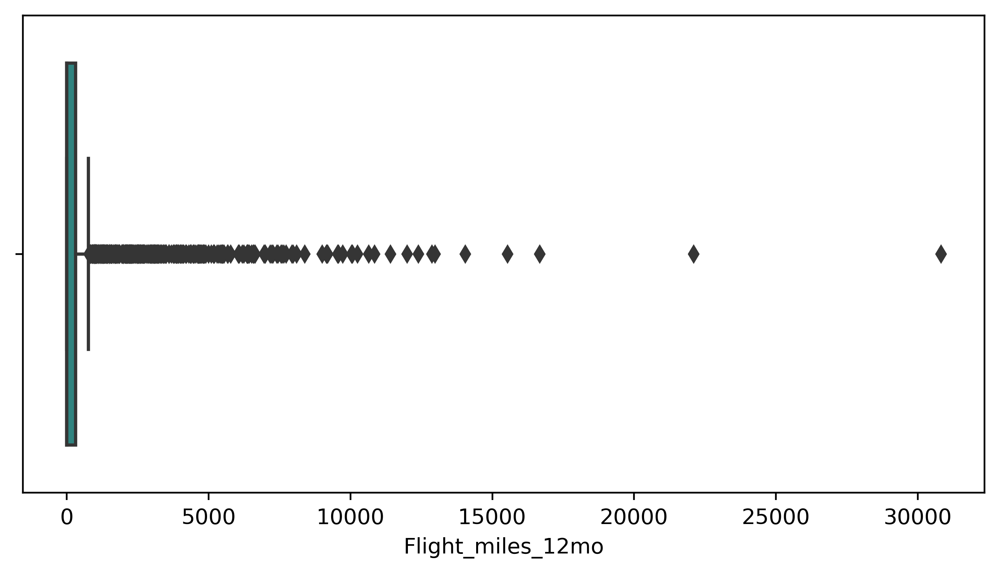

In [11]:
sns.boxplot(x=df['Flight_miles_12mo'], orient='h', palette='viridis')

<Axes: xlabel='Flight_trans_12'>

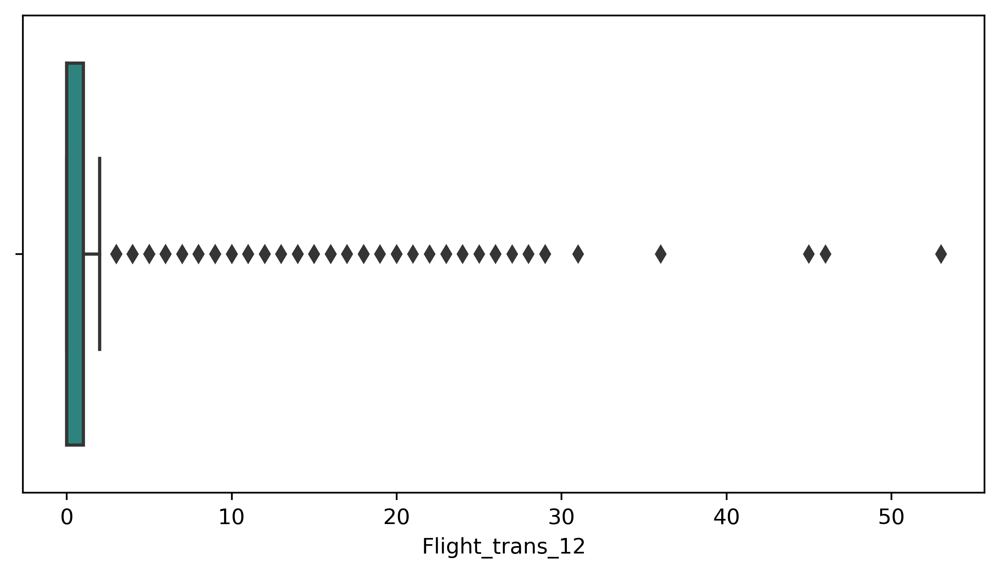

In [12]:
sns.boxplot(x=df['Flight_trans_12'], orient='h', palette='viridis')

<Axes: xlabel='Days_since_enroll'>

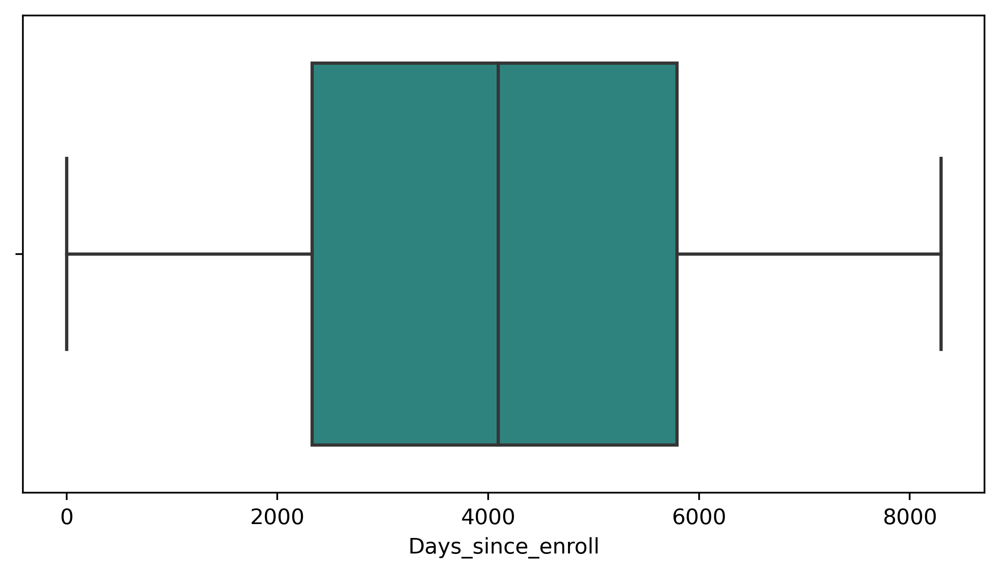

In [13]:
sns.boxplot(x=df['Days_since_enroll'], orient='h', palette='viridis')

In [14]:
# By plotting Boxplots and histograms of columns we can see that data is not normally distributed 

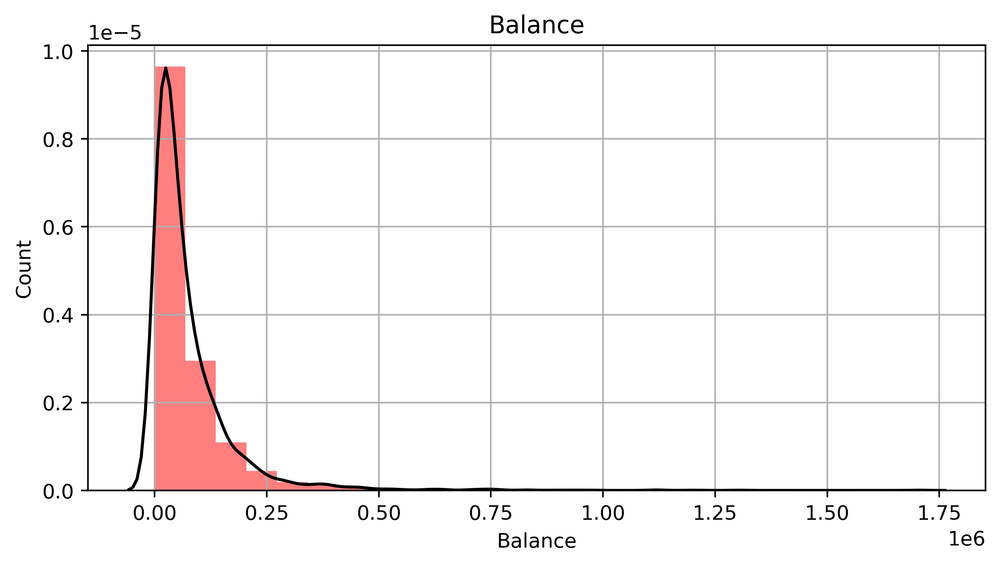

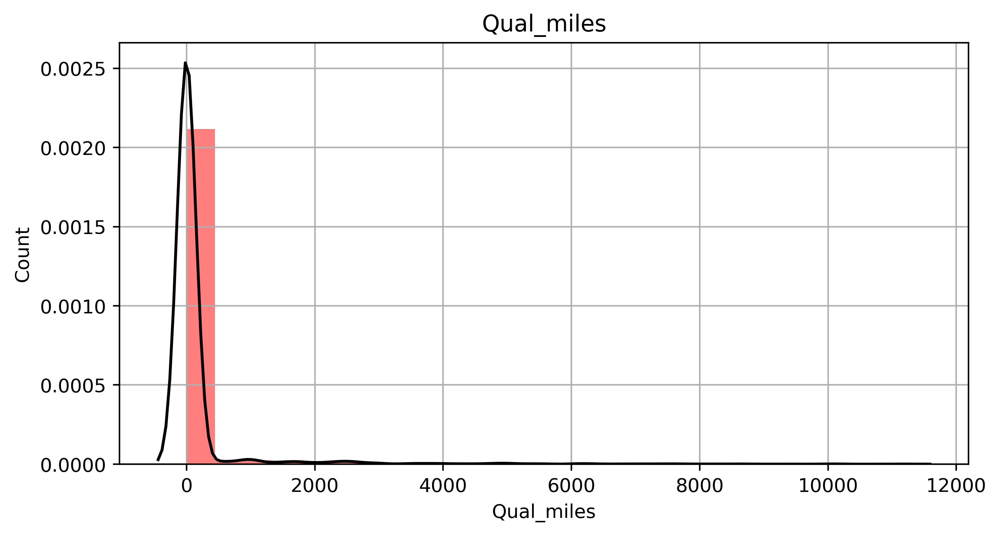

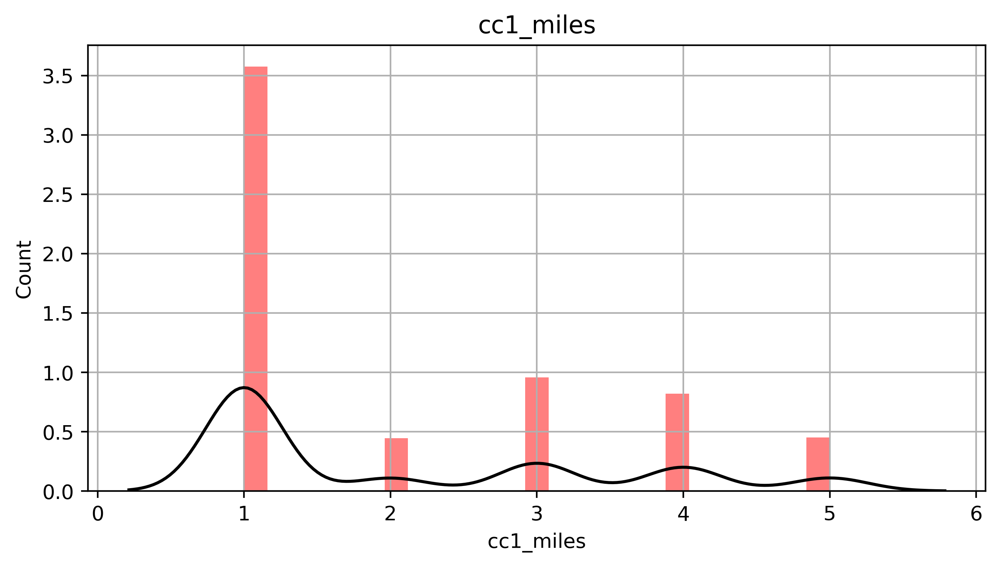

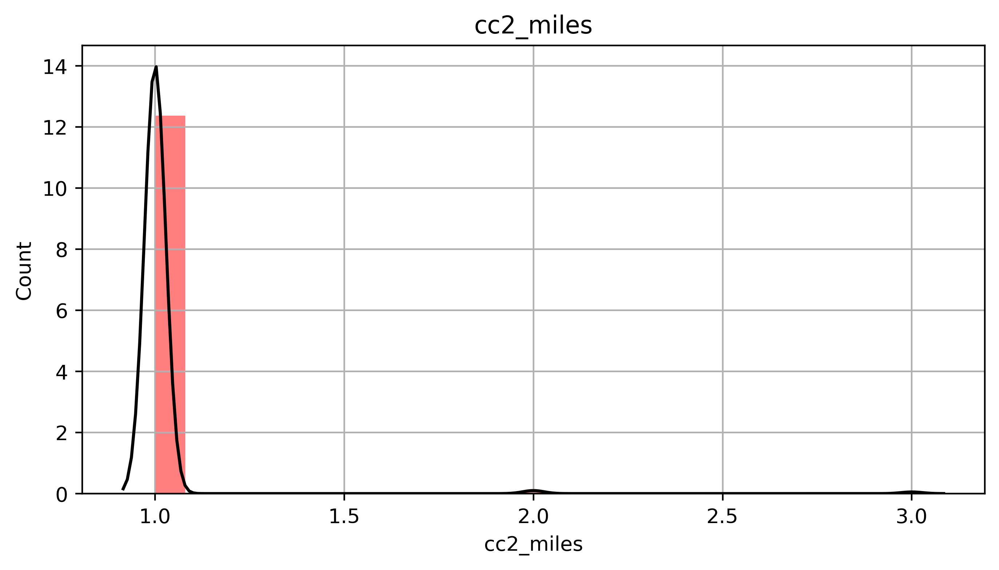

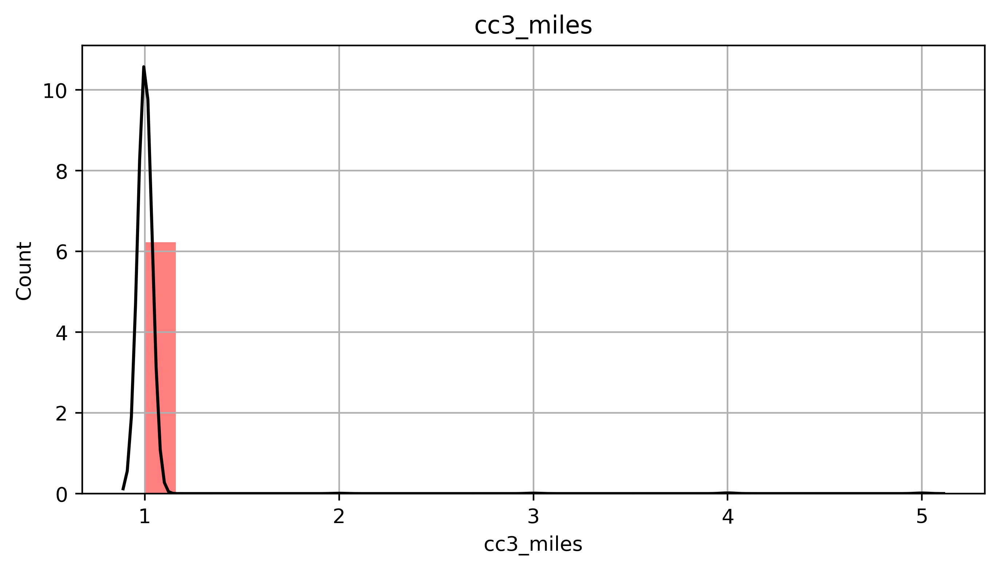

...

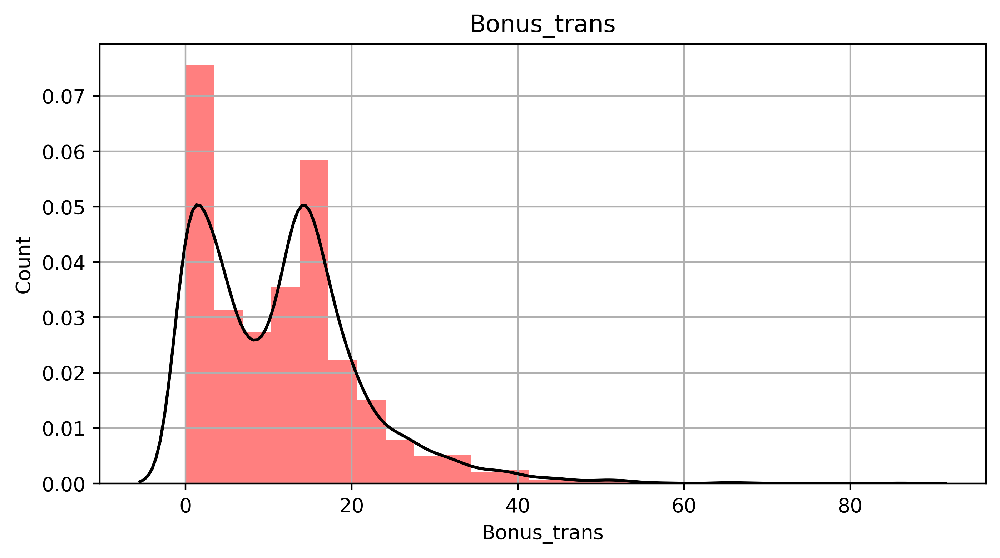

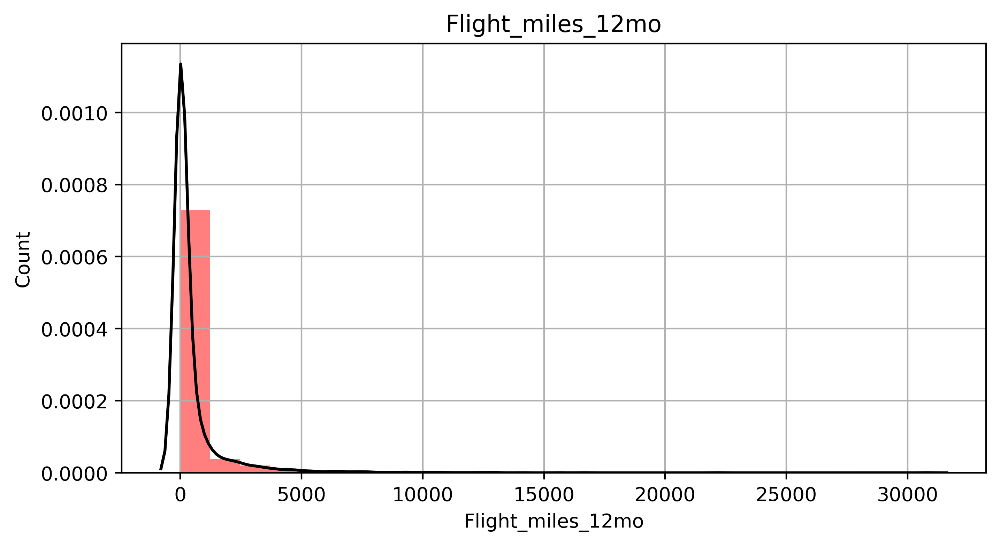

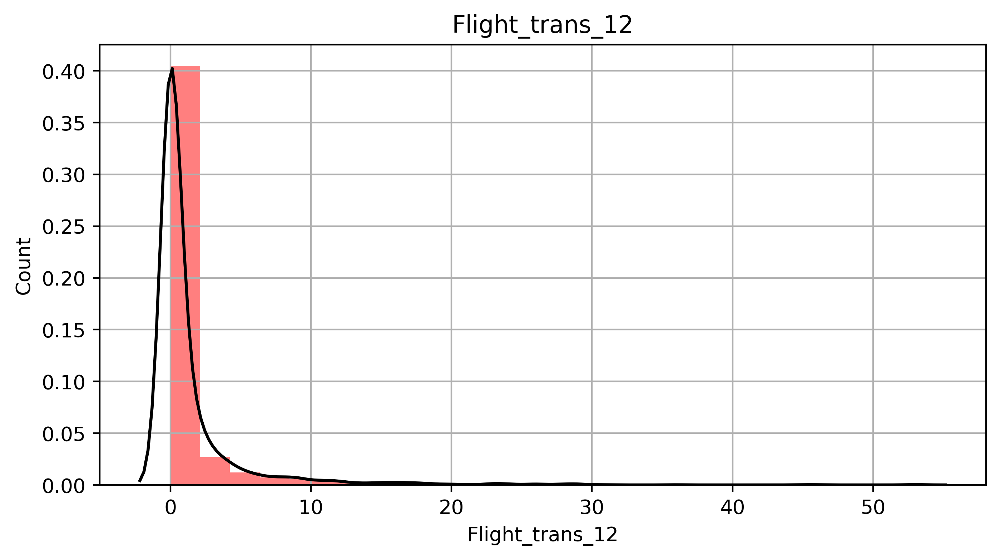

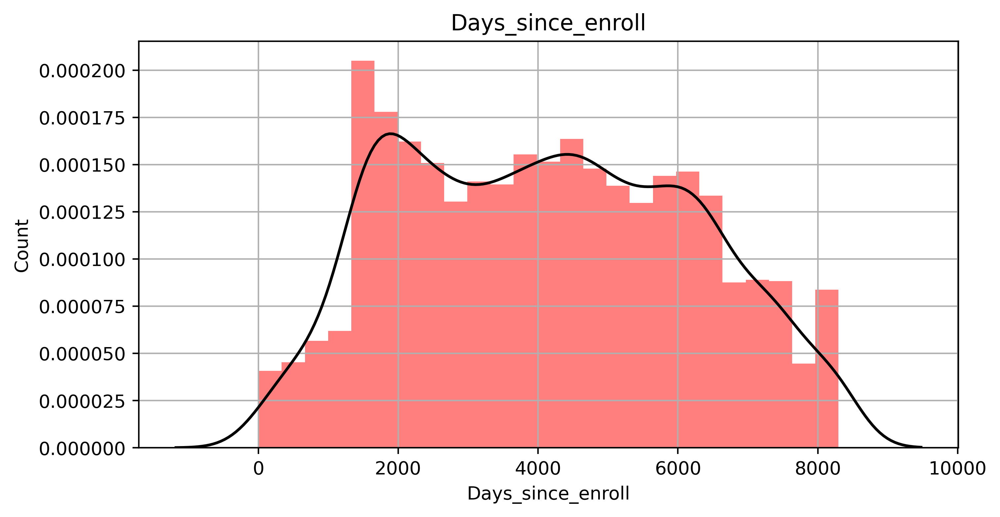

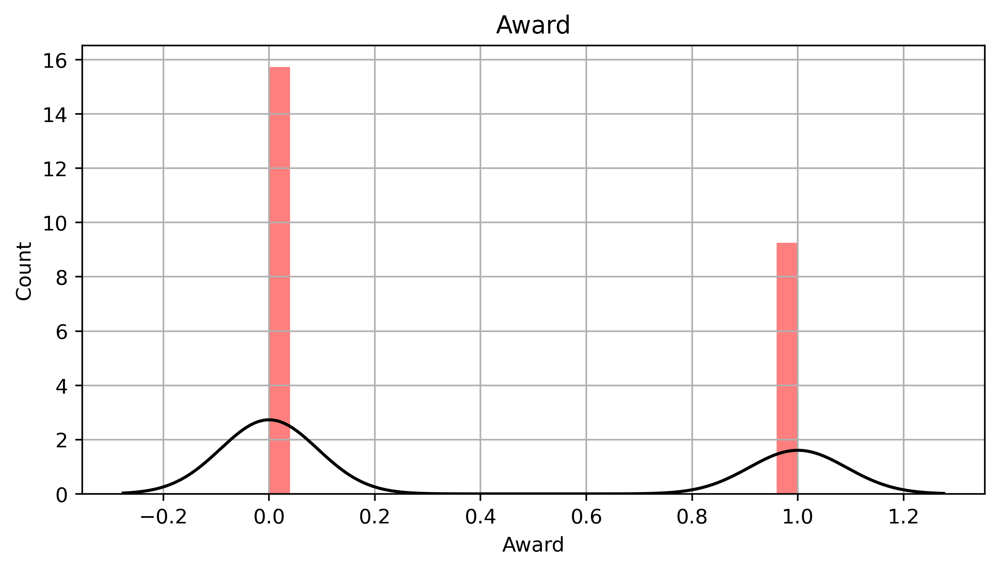

In [15]:
for feature in df.columns:
    df[feature].hist(bins=25, alpha=0.5, color='red', density=True)  
    plt.ylabel('Count')
    plt.title(feature)
    sns.kdeplot(df[feature], color='black')
    plt.show()

In [16]:
# By plotting histograms, kdeplots, boxplots we can see data is not normally distributed

In [17]:
# Feature Scaling

In [18]:
# Standardizing the data
sc = StandardScaler()
x_std = sc.fit_transform(df)
x_std.shape

(3998, 11)

In [19]:
# Hierarchicahl clustering (Single linkage)
# Hierarchical clustering is not the good option for clustering huge data but still we will try it


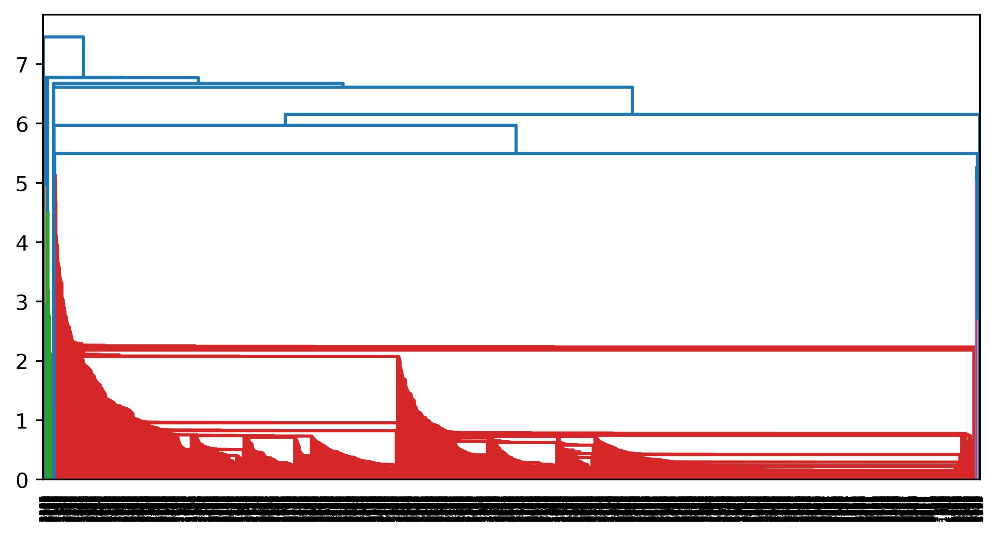

In [20]:
lk=hierarchy.linkage(x_std, method='single')
dendrogram=hierarchy.dendrogram(lk)

In [21]:
# Due to huge dataset the dendrogram is not interpretable 
# This cannot be a good approch to deal clustering with huge dataset using Hierarchical clustering

In [22]:
# Hierarchical clustering (Complete Linkage)

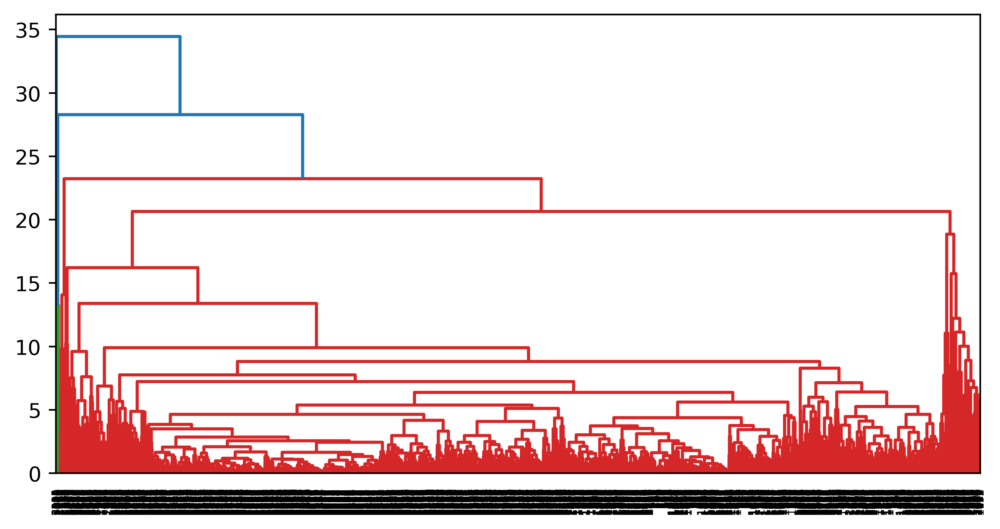

In [23]:
lk1 = hierarchy.linkage(x_std, method='complete')
dendrogram1 = hierarchy.dendrogram(lk1)

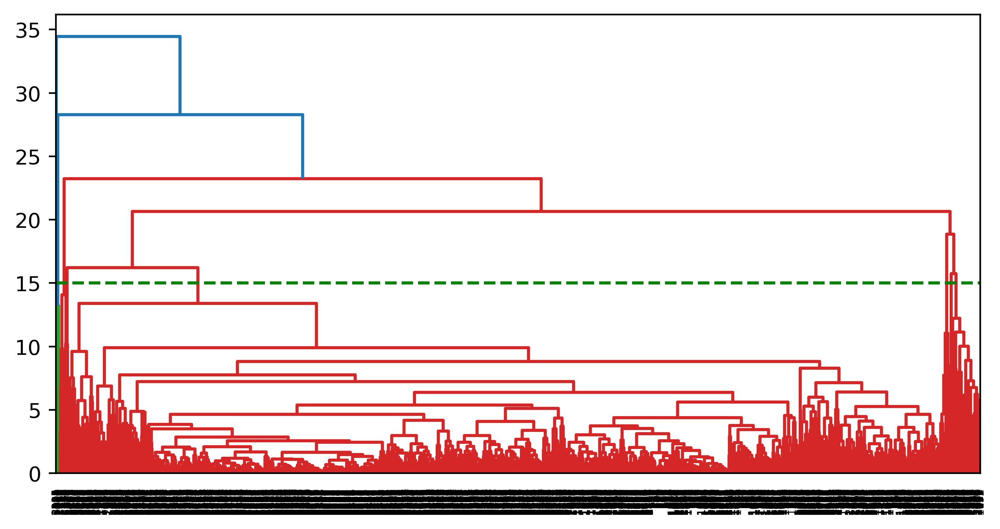

In [24]:
lk2 = hierarchy.linkage(x_std, method='complete')
dendrogram1 = hierarchy.dendrogram(lk2)
plt.axhline(y=15, linestyle='--', color='green')

In [25]:
# As we can see there is overlaping of clusters over other and it is not good approach 

In [26]:
# Hierarchical Clustering Model Building

In [27]:
hc = AgglomerativeClustering(n_clusters = 6)
y_Pred_hc = hc.fit_predict(x_std)
y_Pred_hc

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [28]:
df['Hierarchy_Cluster'] = y_Pred_hc
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1


In [29]:
# Visualizing Clusters

<Axes: xlabel='Qual_miles', ylabel='Bonus_miles'>

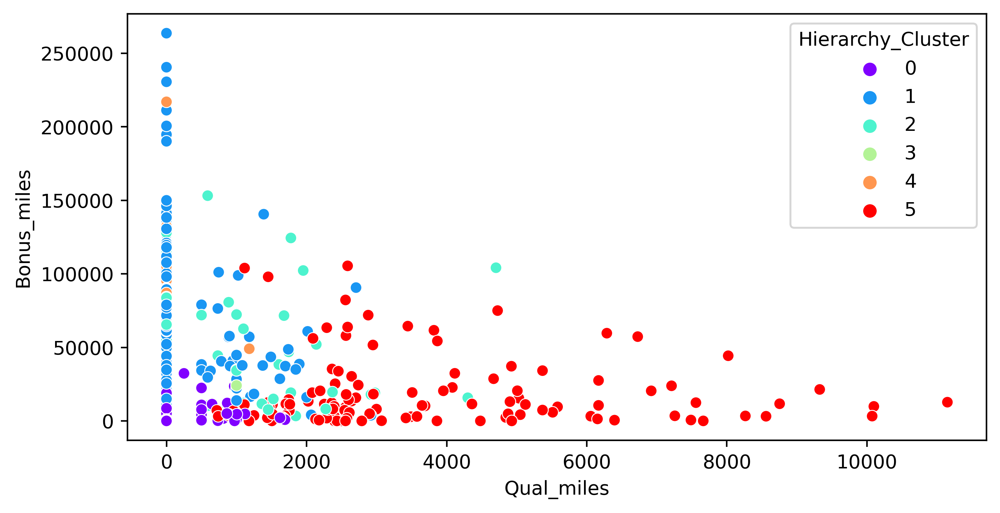

In [30]:
sns.scatterplot(x=df['Qual_miles'], y=df['Bonus_miles'], hue=df['Hierarchy_Cluster'], palette='rainbow')

<Axes: xlabel='Balance', ylabel='Bonus_miles'>

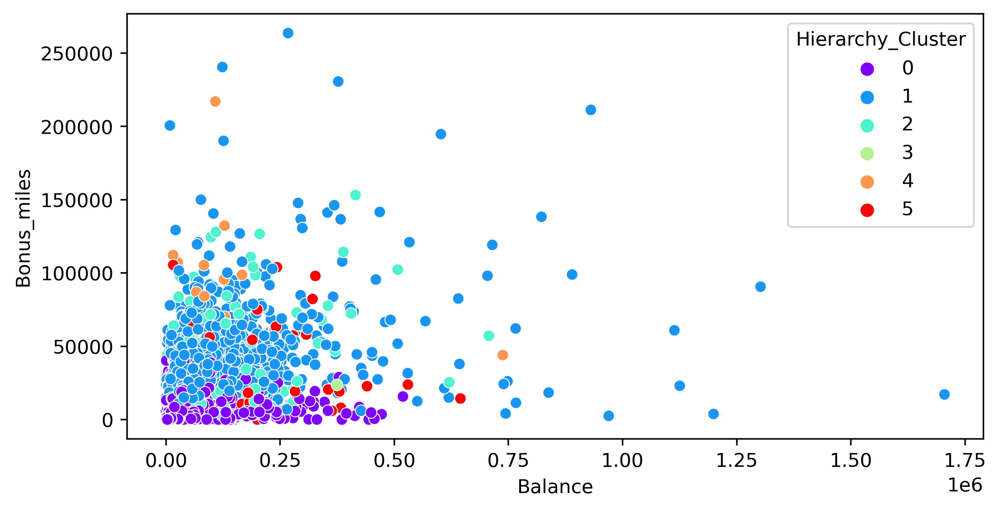

In [31]:
sns.scatterplot(x=df['Balance'], y=df['Bonus_miles'], hue=df['Hierarchy_Cluster'], palette='rainbow')

In [32]:
# Analyzing Clusters

In [33]:
df[df['Hierarchy_Cluster']==0]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
5,16420,0,1,1,1,0,0,0,0,6942,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3993,3974,0,1,1,1,365,3,0,0,1397,0,0
3994,18476,0,1,1,1,8525,4,200,1,1403,1,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0


In [34]:
df[df['Hierarchy_Cluster']==1]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1
6,84914,0,3,1,1,27482,25,0,0,6994,0,1
9,104860,0,3,1,1,28426,28,1150,3,6931,1,1
11,96522,0,5,1,1,61105,19,0,0,6924,1,1
15,28495,0,4,1,1,49442,15,0,0,6912,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3979,57793,0,3,1,1,20959,15,1198,3,1424,1,1
3980,28867,0,3,1,1,19169,28,0,0,1425,0,1
3985,59017,0,4,1,1,34746,25,0,0,1418,0,1
3991,39142,0,3,1,1,14981,28,0,0,1408,0,1


In [35]:
df[df['Hierarchy_Cluster']==2]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster
50,108137,0,1,1,1,6368,5,6368,5,6844,0,2
65,53914,0,3,1,1,33767,45,5550,29,6826,1,2
94,185549,0,5,1,1,110859,39,2950,16,6778,1,2
112,124198,0,5,1,1,66330,23,4833,10,7710,0,2
121,205126,0,5,1,1,126630,45,2250,10,7668,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
3907,126490,0,1,1,1,8808,15,5183,12,1566,0,2
3911,55922,2273,1,1,1,8104,19,4104,16,1552,0,2
3917,130748,0,4,1,1,65510,37,6349,7,1545,0,2
3934,76595,0,1,1,1,10577,2,9577,1,1515,0,2


In [36]:
df[df['Hierarchy_Cluster']==3]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster
8,443003,0,3,2,1,1753,43,3850,12,6948,1,3
198,8669,0,1,3,1,11397,16,0,0,7486,1,3
226,117329,0,1,2,1,6448,11,0,0,7416,1,3
381,167670,0,1,3,1,15907,13,0,0,6994,0,3
392,11189,0,1,2,1,9044,20,0,0,8296,1,3
561,380930,0,2,2,1,22485,25,213,1,6539,1,3
794,55610,0,1,2,1,5095,13,0,0,6151,0,3
940,44824,0,1,3,1,21107,19,2000,4,5916,1,3
1149,84856,0,1,2,1,6894,13,0,0,5547,0,3
1270,16103,0,1,3,1,10819,13,0,0,5427,0,3


In [37]:
df[df['Hierarchy_Cluster']==4]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster
106,96627,1182,1,1,3,49059,26,2300,9,6738,1,4
343,112501,0,1,1,2,19140,11,0,0,7101,0,4
384,28193,0,5,1,4,103456,32,0,0,6980,1,4
850,25629,0,4,1,5,107308,36,600,2,5966,1,4
904,15835,0,2,1,5,112171,16,0,0,5825,1,4
1036,154664,0,4,1,3,73881,33,0,0,5769,0,4
1244,166465,0,4,1,4,98717,30,0,0,5531,0,4
1300,737514,0,3,1,4,43993,40,2150,7,5030,0,4
1878,128302,0,5,1,4,132263,32,400,2,4103,1,4
1917,82981,0,5,1,3,105325,44,1000,2,3964,1,4


In [38]:
df[df['Hierarchy_Cluster']==5]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster
21,185681,2024,1,1,1,13300,16,1800,9,6896,1,5
70,84409,5031,2,1,1,15436,16,1150,4,7766,0,5
177,28086,1745,2,1,1,7368,12,0,0,7549,1,5
193,52738,2398,1,1,1,0,0,0,0,7498,0,5
207,23184,1250,1,1,1,3694,12,1150,3,7467,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...
3701,8964,3861,1,1,1,0,0,0,0,594,0,5
3747,6015,4929,1,1,1,0,0,0,0,30,0,5
3811,15832,2376,1,1,1,8130,20,500,1,1698,1,5
3897,179832,2954,3,1,1,18218,20,2500,5,1569,1,5


In [39]:
df.groupby('Hierarchy_Cluster').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
Hierarchy_Cluster,,,,,,,,,,,
0,46347.876483,9.032311,1.244172,1.000000,1.000000,4870.103476,6.910429,214.900613,0.674029,3770.226176,0.184458
1,116758.363636,37.024351,3.672890,1.000000,1.000000,38535.185065,18.683442,339.391234,1.029221,4756.469968,0.672078
2,134880.892308,393.323077,2.430769,1.000000,1.000000,36582.169231,29.338462,5915.523077,16.638462,4599.607692,0.753846
3,68876.581395,23.255814,1.139535,2.348837,1.000000,14689.837209,17.534884,582.627907,2.209302,3968.930233,0.395349
4,129951.388889,65.666667,3.388889,1.000000,3.722222,86259.888889,26.222222,422.222222,1.333333,4488.777778,0.500000
5,110219.330769,3502.323077,1.861538,1.000000,1.000000,17226.661538,11.092308,727.153846,2.269231,4161.053846,0.600000


In [40]:
# We can say that clusters are formed on the basics of flight_transactions and Days_Enroll balance
# CLsuter 0 is having lowest flight transactions and most recently enrolled
# CLsuter 1 is having slightly more flight transactions and most early enrolled
# CLsuter 2 & 3 are having moderate flight transactions and early recently enrolled


In [41]:
#2. K-Means Clustering

In [42]:
km = KMeans()
yp = km.fit_predict(x_std)
yp

array([7, 7, 7, ..., 3, 4, 4])

In [43]:
# Visualizing clusters with centroids

In [44]:
km.cluster_centers_

array([[ 1.15867741e+00,  4.63067640e-01,  2.02410038e-01,
        -9.82542913e-02, -6.27744600e-02,  7.38394890e-01,
         1.82523047e+00,  3.92636635e+00,  4.20476579e+00,
         2.67837641e-01,  8.57655647e-01],
       [ 4.25258375e-01,  7.09897334e+00,  9.40384936e-03,
        -9.82542913e-02, -6.27744600e-02,  1.09946888e-01,
         9.79636086e-02,  3.59140855e-01,  3.99928303e-01,
        -8.16339914e-02,  3.24768269e-01],
       [ 6.43727941e-01, -1.06084728e-01,  1.55748809e+00,
        -9.82542913e-02, -5.02515175e-02,  1.37266204e+00,
         8.68710523e-01, -5.53493967e-02, -5.66850823e-02,
         4.06484156e-01,  5.41691018e-01],
       [-1.52821295e-01, -6.10423740e-02, -2.64548773e-01,
        -9.82542913e-02, -6.27744600e-02, -2.72145969e-01,
        -1.06423199e-01, -3.16532610e-02, -2.77800029e-02,
         6.69755034e-02,  1.30365921e+00],
       [-3.87712721e-01, -1.43828024e-01, -5.85942952e-01,
        -9.82542913e-02, -6.27744600e-02, -5.26986082e-01,
  

In [45]:
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,1
3997,54899,0,1,1,1,500,1,500,1,1401,0,0


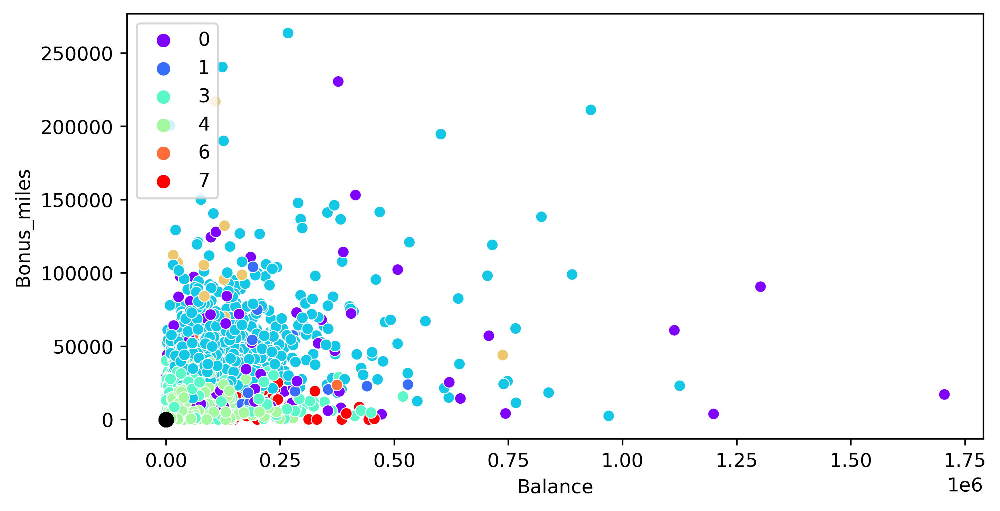

In [46]:
sns.scatterplot(x=df['Balance'], y=df['Bonus_miles'], hue=yp, palette='rainbow')
plt.legend(loc='upper left')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:,5], c='black', s=50)

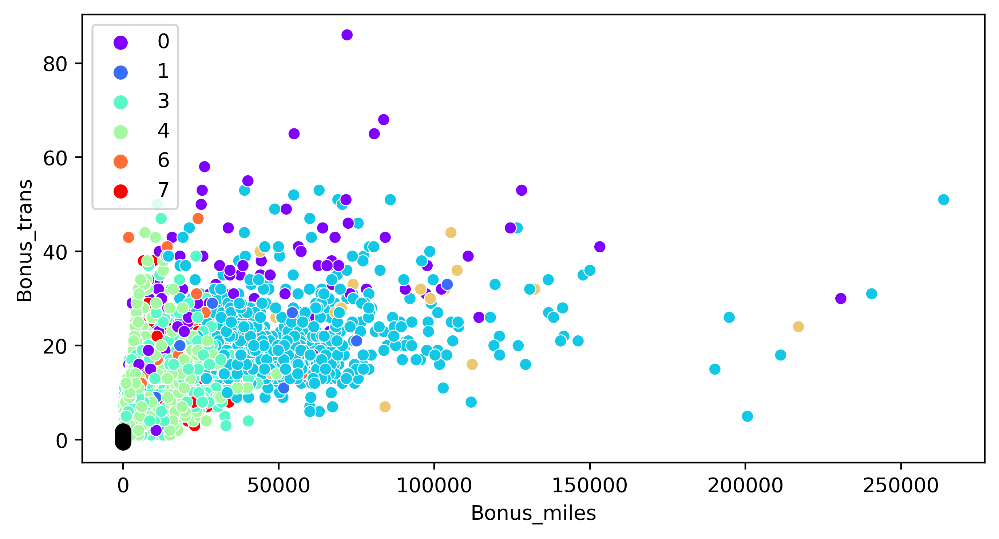

In [47]:
sns.scatterplot(x=df['Bonus_miles'], y=df['Bonus_trans'], hue=yp, palette='rainbow')
plt.legend(loc='upper left')
plt.scatter(km.cluster_centers_[:,5], km.cluster_centers_[:,6], c='black', s=50)

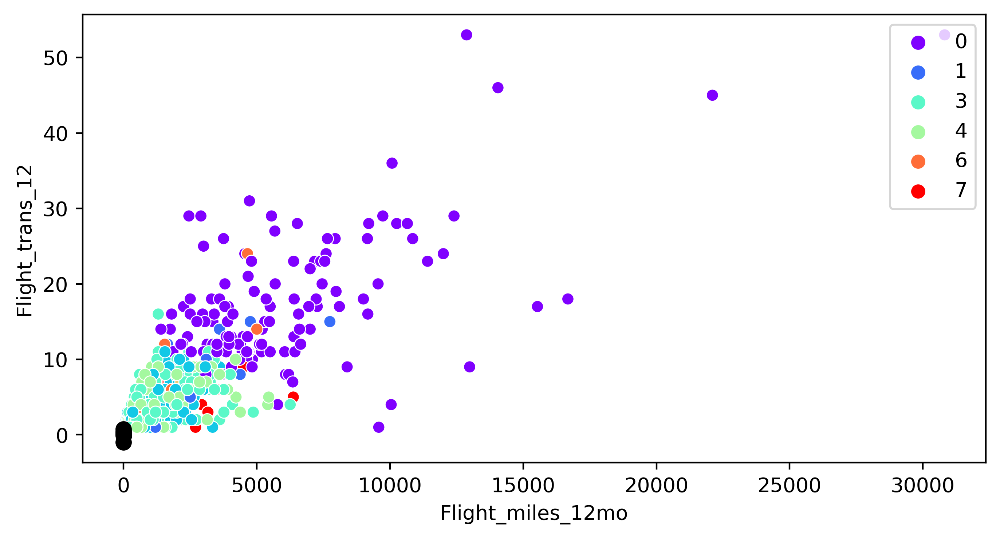

In [48]:
sns.scatterplot(x=df['Flight_miles_12mo'], y=df['Flight_trans_12'], hue=yp, palette='rainbow')
plt.legend(loc='upper right')
plt.scatter(km.cluster_centers_[:,8], km.cluster_centers_[:,9], c='black', s=50)

In [49]:
# here we can see the clusters are not formed correctly there is jumbling of clusters.

In [50]:
# Plotting elbow graph to get number of ideal clusters to formed 

In [51]:
df.shape

(3998, 12)

In [52]:
len(df)

3998

In [53]:
wcss = []
for i in range(1,15):
    km = KMeans(n_clusters= i)
    km.fit_predict(x_std)
    wcss.append(km.inertia_)

In [54]:
# Elbow Graph

Text(0.5, 1.0, 'Elbow Graph')

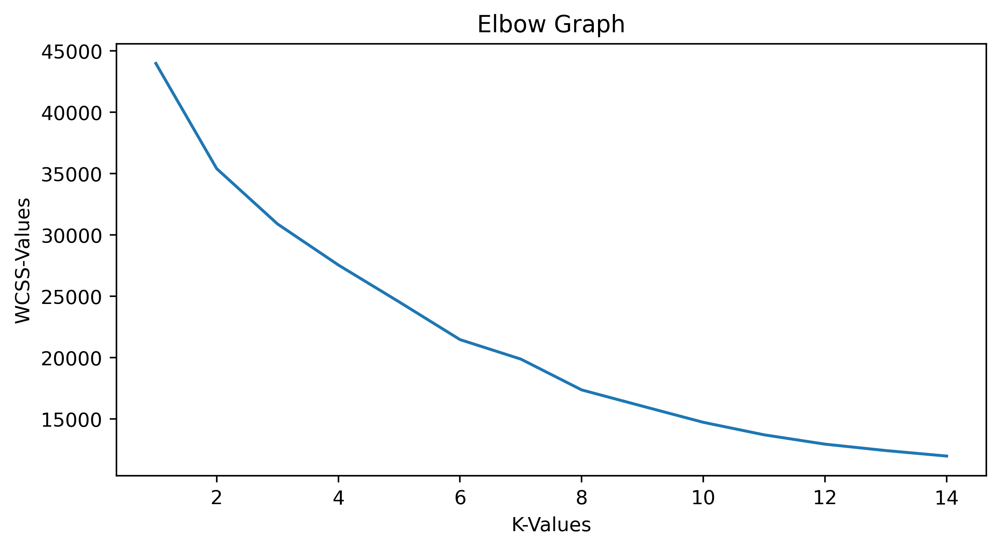

In [55]:
plt.plot(range(1,15), wcss)
plt.xlabel('K-Values')
plt.ylabel('WCSS-Values')
plt.title('Elbow Graph')

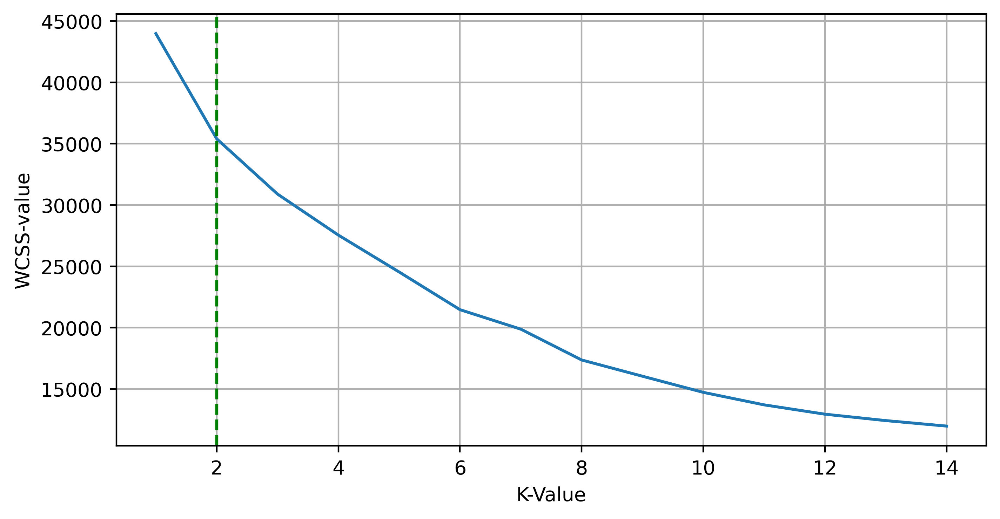

In [56]:
plt.plot(range(1,15), wcss)
plt.axvline(x=2, linestyle='--', color='green')
plt.xlabel('K-Value')
plt.ylabel('WCSS-value')
plt.grid(True)


In [57]:
# Here the slope of line os drgastically changing from cluster no 2 
# So I think 2 is the ideal no of clusters to made

In [58]:
# Final K-Means Model

In [59]:
km_final = KMeans(n_clusters=2)
y_pred_km = km_final.fit_predict(x_std)
df['y_pred_km'] = y_pred_km
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster,y_pred_km
0,28143,0,1,1,1,174,1,0,0,7000,0,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1,1


In [60]:
# Visualizing the clusters with their centroids

Text(0, 0.5, 'Bonus_miles')

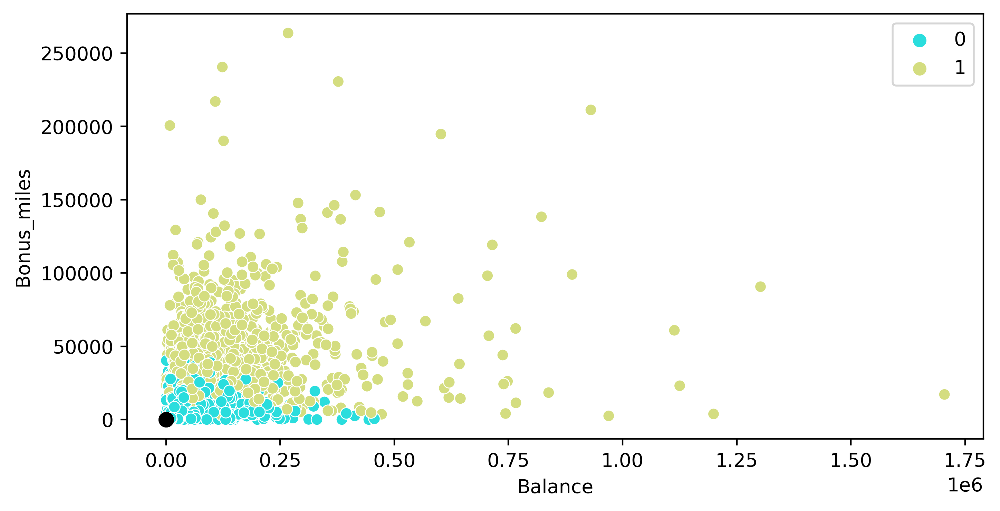

In [61]:
sns.scatterplot(x = df['Balance'], y = df['Bonus_miles'], hue=y_pred_km, palette='rainbow')
plt.scatter(km_final.cluster_centers_[:,1], km_final.cluster_centers_[:,6], c='black', s=50)
plt.xlabel('Balance')
plt.ylabel('Bonus_miles')

Text(0, 0.5, 'Bonus_trans')

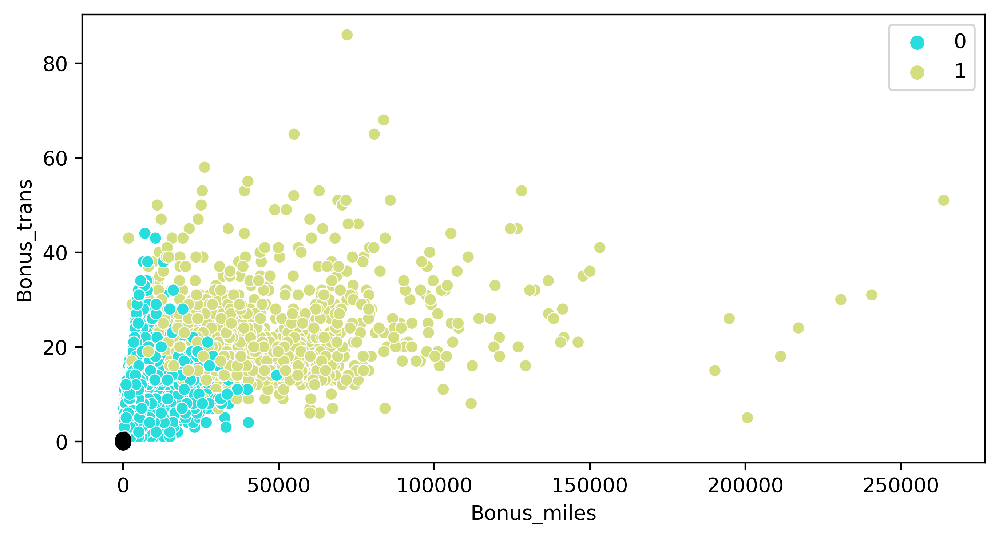

In [62]:
sns.scatterplot(x = df['Bonus_miles'], y = df['Bonus_trans'], hue=y_pred_km, palette='rainbow')
plt.scatter(km_final.cluster_centers_[:,6], km_final.cluster_centers_[:,7], c='black', s=50)
plt.xlabel('Bonus_miles')
plt.ylabel('Bonus_trans')

Text(0, 0.5, 'Flight_trans_12')

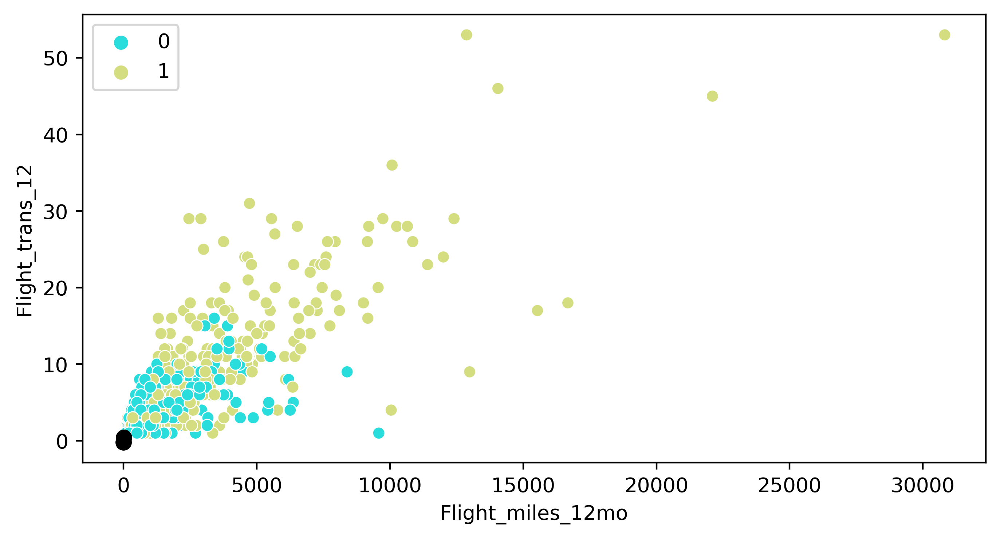

In [63]:
sns.scatterplot(x = df['Flight_miles_12mo'], y = df['Flight_trans_12'], hue=y_pred_km, palette='rainbow')
plt.scatter(km_final.cluster_centers_[:,8], km_final.cluster_centers_[:,9], c='black', s=50)
plt.xlabel('Flight_miles_12mo')
plt.ylabel('Flight_trans_12')

In [64]:
# We can see the overlaping of clusters due to huge datasets and presence of outliers
# We need to use DBSCAN method to deal with huge datasets for clustering 

In [65]:
# Analyzing clusters created by Final Model

In [66]:
df[df['y_pred_km']==0]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster,y_pred_km
0,28143,0,1,1,1,174,1,0,0,7000,0,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0,0
5,16420,0,1,1,1,0,0,0,0,6942,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,0,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,1,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0,0


In [67]:
df[df['y_pred_km']==1]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster,y_pred_km
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1,1
6,84914,0,3,1,1,27482,25,0,0,6994,0,1,1
8,443003,0,3,2,1,1753,43,3850,12,6948,1,3,1
9,104860,0,3,1,1,28426,28,1150,3,6931,1,1,1
11,96522,0,5,1,1,61105,19,0,0,6924,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3966,91605,0,4,1,1,37840,18,0,0,1444,0,1,1
3973,72297,0,3,1,1,16241,16,0,0,1587,1,1,1
3974,58387,0,3,1,1,14581,39,0,0,1435,0,1,1
3979,57793,0,3,1,1,20959,15,1198,3,1424,1,1,1


In [68]:
df.groupby('y_pred_km').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster
y_pred_km,,,,,,,,,,,,
0,45057.986276,89.265579,1.310831,1.016691,1.000371,5423.415801,7.366469,215.291172,0.635757,3721.622404,0.206973,0.254822
1,132760.658986,257.798771,3.610599,1.009985,1.036866,41429.117512,20.380952,967.233487,2.902458,4942.417819,0.708909,1.271889


We can see the people who approximately enrolled from last 10 years and having low Balance, Qualifying miles, miles earned with credit cards, Bonus miles, no. of flight transactions and miles in last 12 months are clustered together in 0th cluster.

Whereas, people who approximately enrolled before past 10 years and having high Balance, Qualifying miles, miles earned with credit cards, Bonus miles, no. of flight transactions and miles in last 12 months are clustered together in 1st cluster.

In [69]:
# K-Means Final Model Evaluation

In [70]:
silhouette_score(x_std, y_pred_km)

0.32531882107641713

In [71]:
# Here the model's performance is not upto the mark, because 
# K-Means clustering algorithm is not able to treat outliers effectively while clustering
# We need to Use DBSCAN Method for clustering the huge datasets with outliers presence

In [72]:
#3. DBSCAN Method for clustering

In [73]:
# Rule 1 -> min_samples = at least 3
# Rule 2 -> no. of samples + 1  ----
#                                 ----- Hyperparameter Tuning
# Rule 3 -> no. of samples * 2  ----

In [74]:
db1 = DBSCAN(eps = 0.5, min_samples=3)
y_pred_db1 = db1.fit_predict(x_std)
df['y_pred_db1'] = y_pred_db1
df['y_pred_db1']

0       0
1       0
2       0
3       0
4      -1
       ..
3994    1
3995    1
3996    6
3997    0
3998    0
Name: y_pred_db1, Length: 3998, dtype: int64

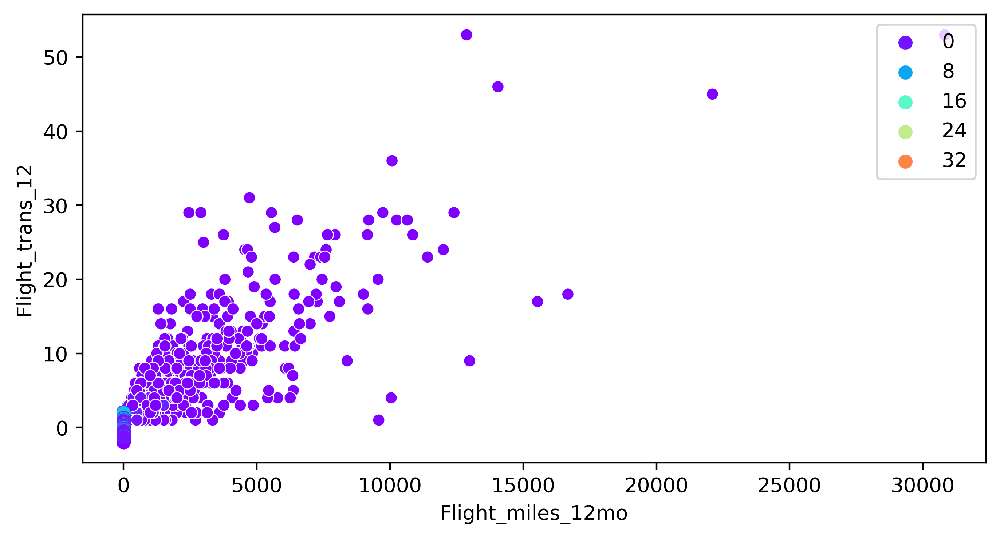

In [75]:
sns.scatterplot(x= df['Flight_miles_12mo'], y = df['Flight_trans_12'], hue = y_pred_db1, palette='rainbow')
plt.scatter(x_std[:,8], x_std[:,9], c=y_pred_db1, cmap='rainbow')
plt.legend(loc = 'upper right')

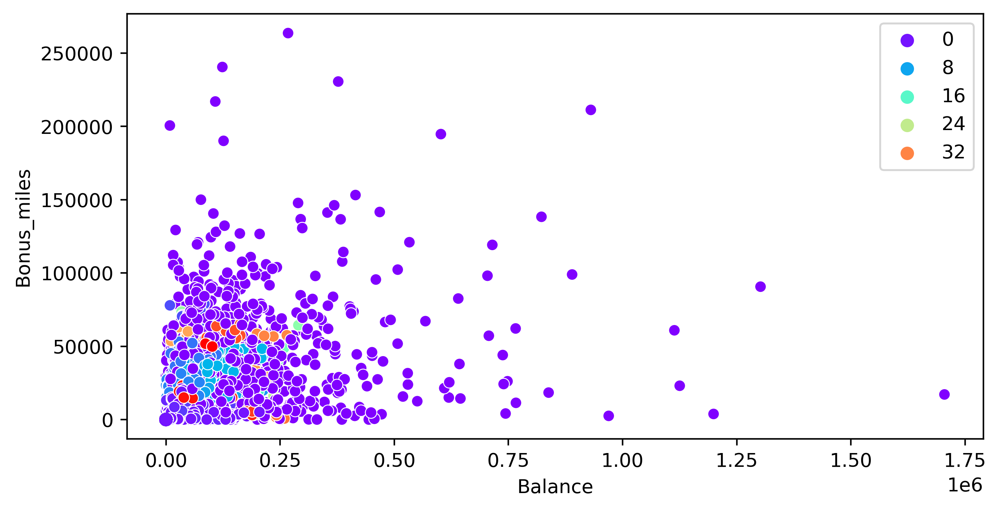

In [76]:
sns.scatterplot(x = df['Balance'], y = df['Bonus_miles'], hue=y_pred_db1, palette='rainbow')
plt.scatter(x_std[:,1], x_std[:,6], c=y_pred_db1, cmap='rainbow')


In [77]:
# DBSCAN has created 5 different clusters for dataset with epsilon value 0.5 and min_samples as 3

In [78]:
# DBSCAN Model Evaluation 

In [79]:
silhouette_score(x_std, y_pred_db1)

-0.11463331205036746

In [80]:
# Hyperparameter Tuning for ideal eps value 

In [81]:
# Rule 2 -> No. of samples + 1

In [82]:
neigh1 = NearestNeighbors(n_neighbors=12).fit(x_std) # (no. of samples + 1) i.e.(11+1)
d1, index1 = neigh1.kneighbors(x_std)
distance1 = np.sort(d1[:,1])
distance1

array([2.26429338e-03, 2.26429338e-03, 2.70567023e-03, ...,
       6.61619449e+00, 6.67812374e+00, 7.46068077e+00])

In [83]:
# Plotting K-distance plot

Text(0, 0.5, 'EPS-Value')

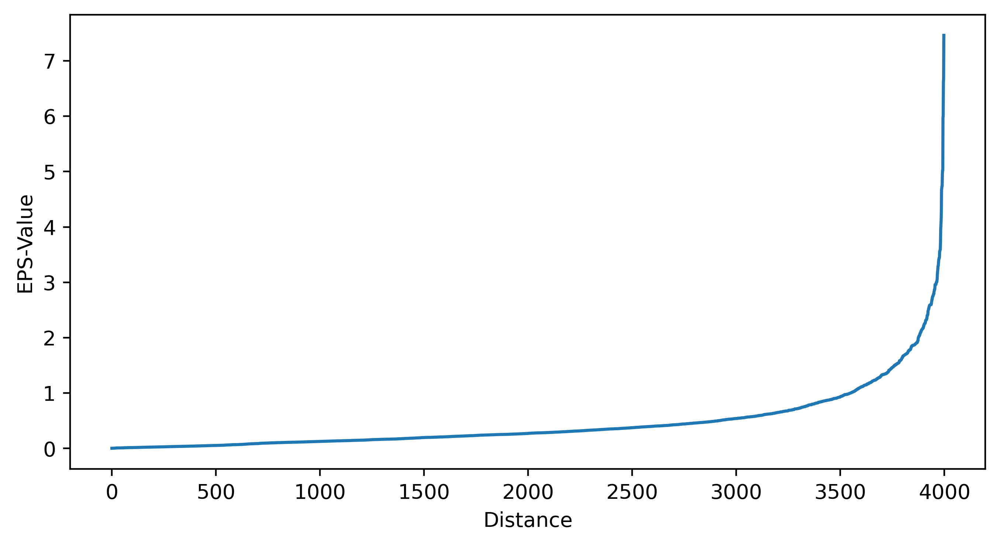

In [84]:
plt.plot(distance1)
plt.xlabel('Distance')
plt.ylabel('EPS-Value')

Text(0, 0.5, 'EPS-Value')

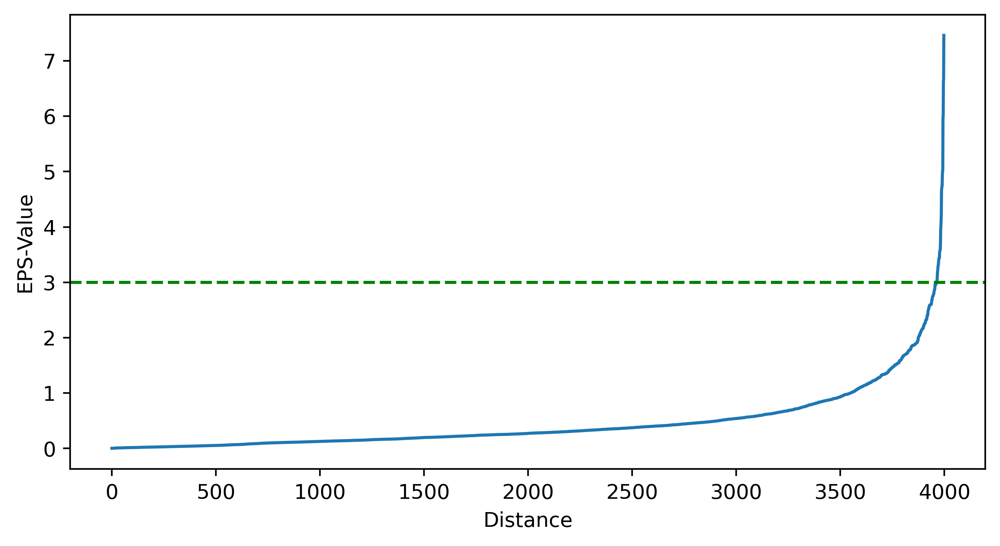

In [85]:
plt.plot(distance1)
plt.axhline(y= 3, linestyle = '--', color = 'green')
plt.xlabel('Distance')
plt.ylabel('EPS-Value')

In [86]:
neigh2 = NearestNeighbors(n_neighbors=22).fit(x_std) # (no. of samples * 2) i.e.(11*2)
d2, index2 = neigh2.kneighbors(x_std)
distance2 = np.sort(d2[:,1])
distance2

array([2.26429338e-03, 2.26429338e-03, 2.70567023e-03, ...,
       6.61619449e+00, 6.67812374e+00, 7.46068077e+00])

Text(0, 0.5, 'EPS-Value')

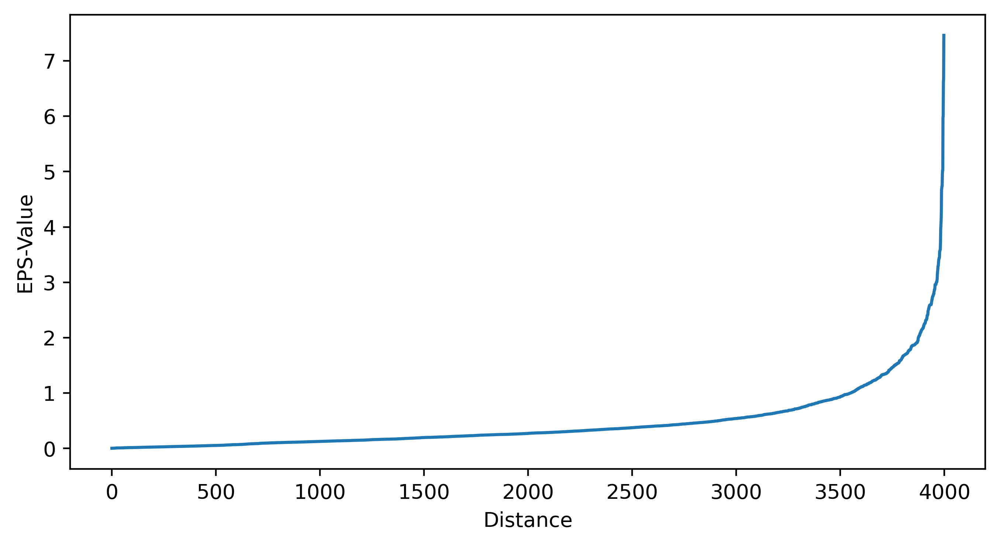

In [87]:
plt.plot(distance2)
plt.xlabel('Distance')
plt.ylabel('EPS-Value')

Text(0, 0.5, 'EPS-Value')

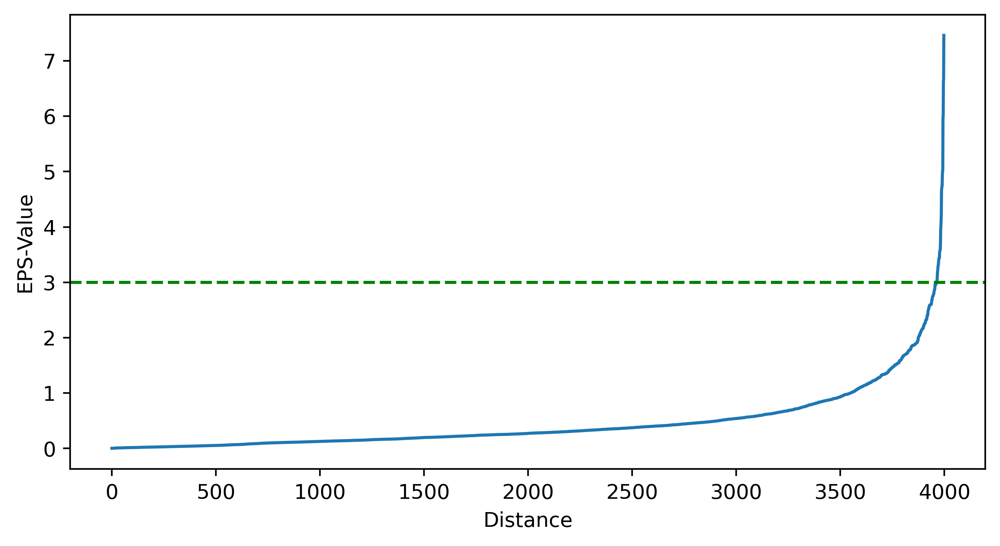

In [88]:
plt.plot(distance2)
plt.axhline(y=3, linestyle='--', color='green')
plt.xlabel('Distance')
plt.ylabel('EPS-Value')

In [89]:
# I think 3 is the ideal eps value where we can see the change in slope of line

In [90]:
# Selecting Final DBSCAN model 

In [91]:
# Model with (min_samples = 12)

In [92]:
db2 = DBSCAN(eps = 3, min_samples=12)
y_pred_db2 = db2.fit_predict(x_std)
df['y_pred_db2'] = y_pred_db2
df['y_pred_db2']

0       0
1       0
2       0
3       0
4       0
       ..
3994    0
3995    0
3996    0
3997    0
3998    0
Name: y_pred_db2, Length: 3998, dtype: int64

In [93]:
# Visualizing Clusters of db2

<Axes: xlabel='Balance', ylabel='Bonus_miles'>

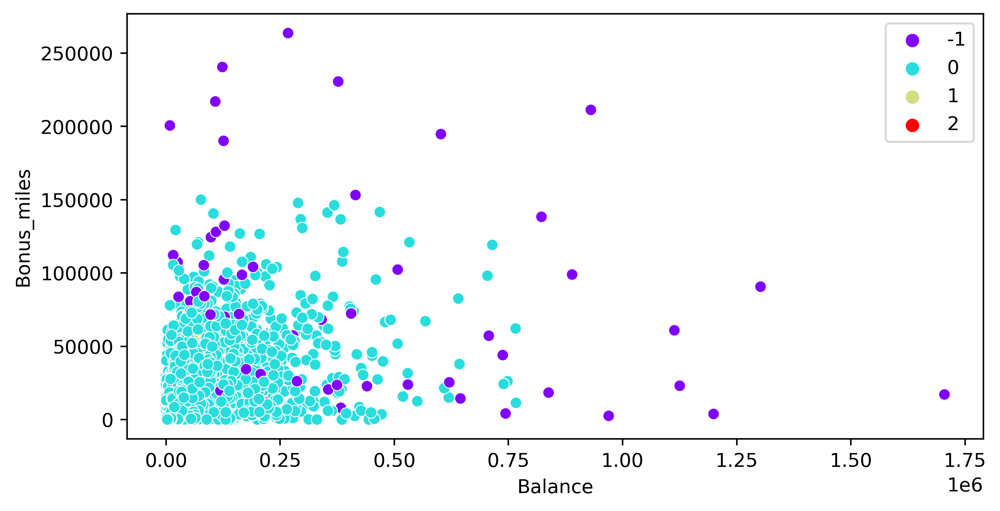

In [94]:
sns.scatterplot(x=df['Balance'], y=df['Bonus_miles'], hue=y_pred_db2, palette='rainbow')

<Axes: xlabel='Flight_miles_12mo', ylabel='Flight_trans_12'>

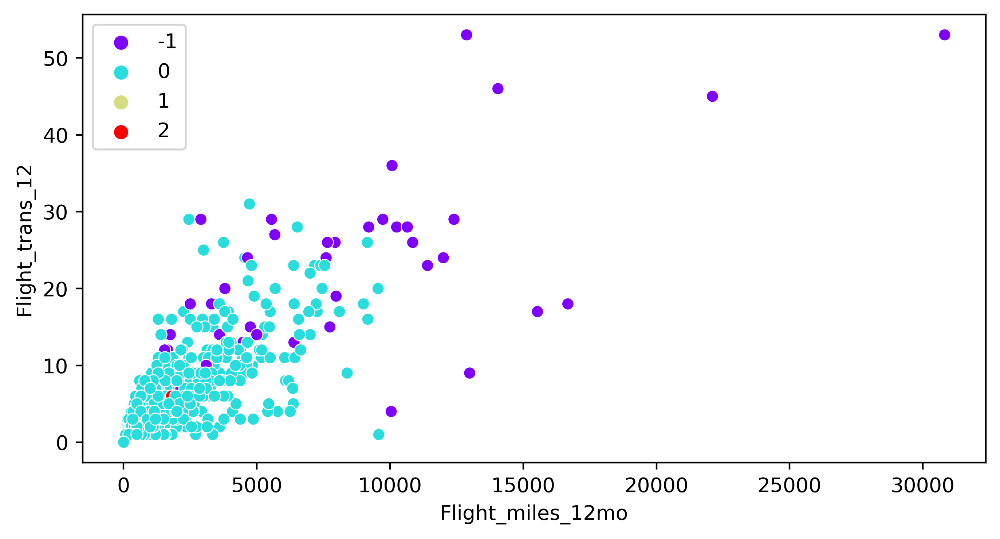

In [95]:
sns.scatterplot(x=df['Flight_miles_12mo'], y=df['Flight_trans_12'], hue=y_pred_db2, palette='rainbow')

<Axes: xlabel='Days_since_enroll', ylabel='Balance'>

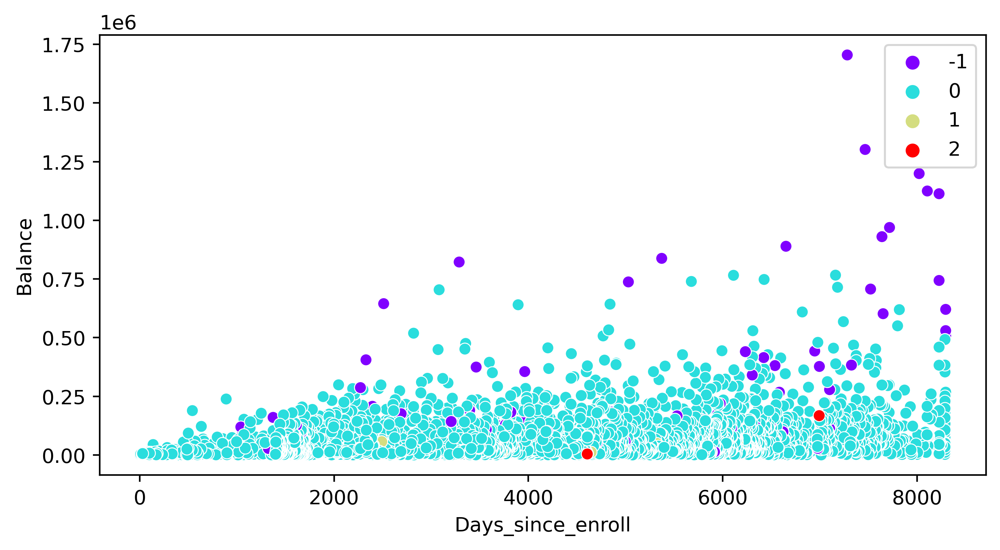

In [96]:
sns.scatterplot(x=df['Days_since_enroll'], y=df['Balance'], hue=y_pred_db2, palette='rainbow')

In [97]:
# Here db2 model has created 4 clusters

In [98]:
# Final DBSCAN  Model Evaluation 

In [99]:
silhouette_score(x_std, y_pred_db2)

0.5445316959259422

In [100]:
# Now we can see there is improvement in sillhouette score of DBSCAN model as compared to Hierarchical & K-Means Clustering model.
# The performance of model is moderate and it is able to deal with outliers also 

In [101]:
# Model with (min_samples = 22)

In [102]:
db3 = DBSCAN(eps = 3, min_samples=22)
y_pred_db3 = db3.fit_predict(x_std)
df['y_pred_db3'] = y_pred_db3
df['y_pred_db3']

0       0
1       0
2       0
3       0
4       0
       ..
3994    0
3995    0
3996    0
3997    0
3998    0
Name: y_pred_db3, Length: 3998, dtype: int64

In [103]:
# Visualizing clusters of db3

<Axes: xlabel='Days_since_enroll', ylabel='Balance'>

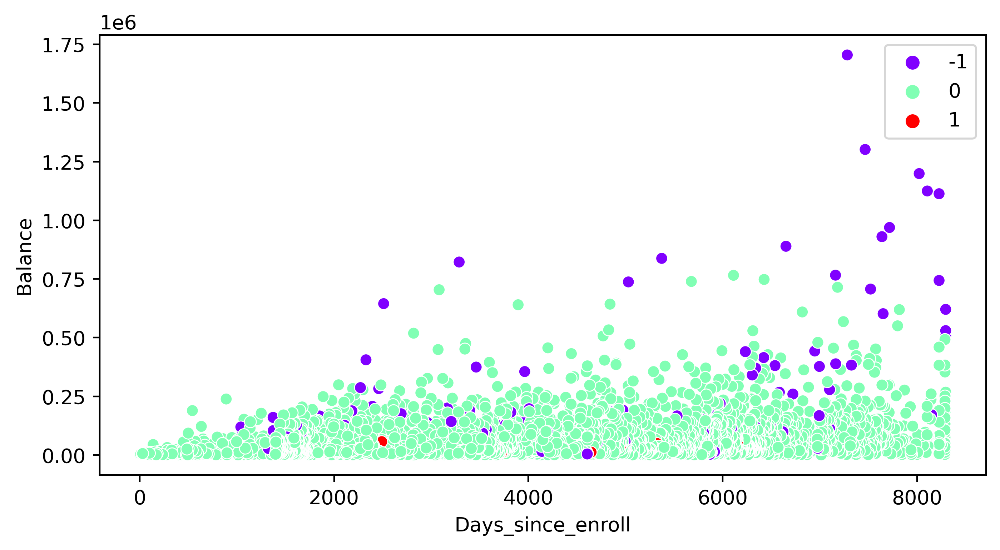

In [104]:
sns.scatterplot(x=df['Days_since_enroll'], y=df['Balance'], hue=y_pred_db3, palette='rainbow')

<Axes: xlabel='Balance', ylabel='Award'>

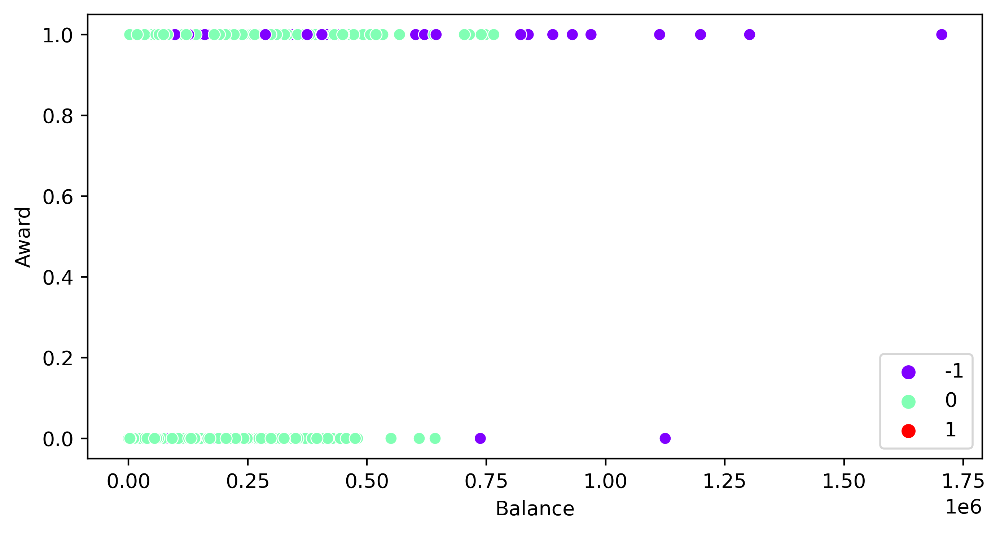

In [105]:
sns.scatterplot(x=df['Balance'], y=df['Award'], hue=y_pred_db3, palette='rainbow')

<Axes: xlabel='Balance', ylabel='cc1_miles'>

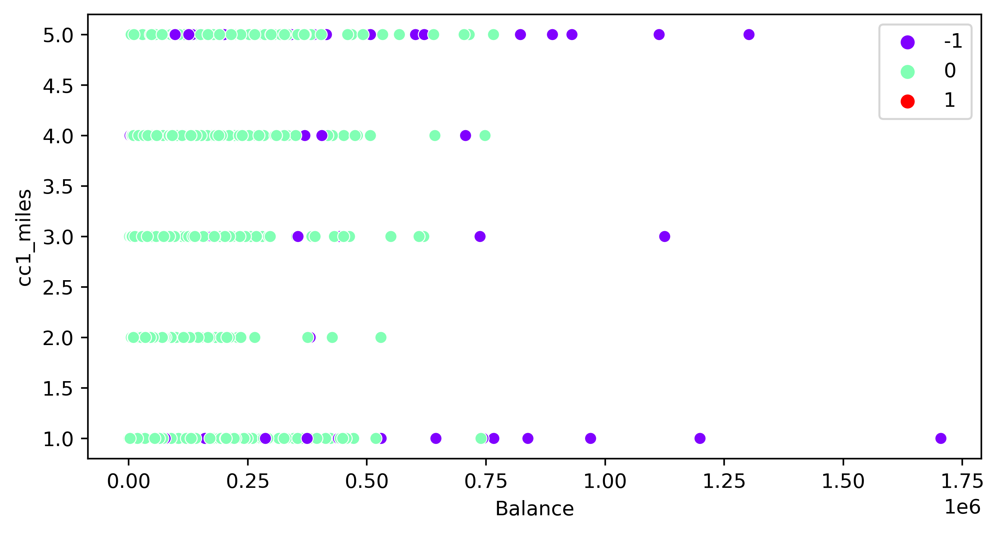

In [106]:
sns.scatterplot(x=df['Balance'], y=df['cc1_miles'], hue=y_pred_db3, palette='rainbow')

<Axes: xlabel='Flight_miles_12mo', ylabel='Flight_trans_12'>

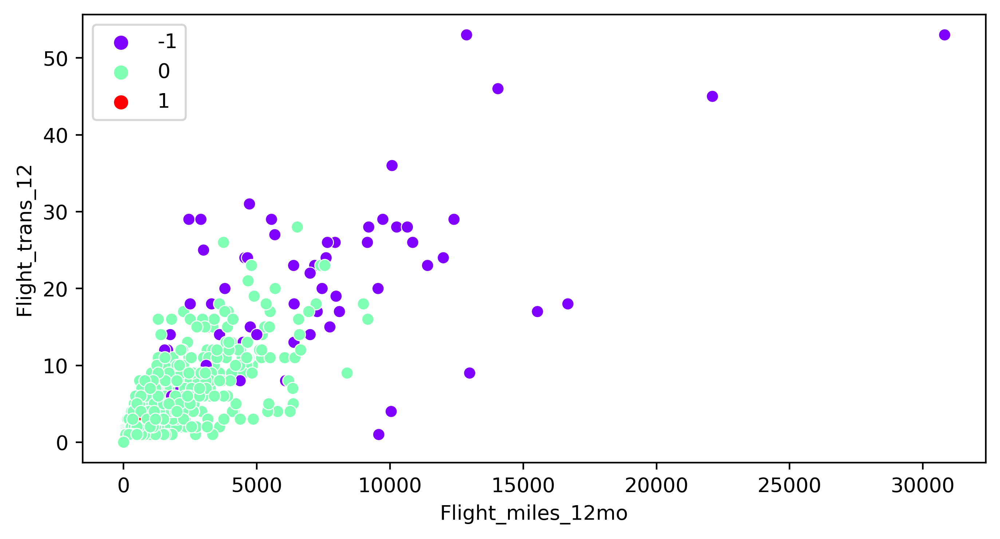

In [107]:
sns.scatterplot(x=df['Flight_miles_12mo'], y=df['Flight_trans_12'], hue=y_pred_db3, palette='rainbow')

In [108]:
# Here db3 model has created 3 clusters 

In [109]:
# bd3 Model Evaluation

In [110]:
silhouette_score(x_std, y_pred_db3)

0.5416431132407591

In [111]:
silhouette_score(x_std, y_pred_db2)

0.5445316959259422

In [112]:
# By comparing the sillhouette scores after Hyperparameter tuning,
# We can see that db2 model is having highest sillhouette score as compared to other models
# other models = (Hierarchial clustering, K-Means CLustering, db1 model, db3 model)

In [113]:
# So db2 is our final model

In [114]:
# Analyzing clusters of Fimal DBSCAN Model

In [115]:
df['y_pred_db2'].unique()

array([ 0, -1,  2,  1], dtype=int64)

In [116]:
df[df['y_pred_db2']==0]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster,y_pred_km,y_pred_db1,y_pred_db2,y_pred_db3
0,28143,0,1,1,1,174,1,0,0,7000,0,0,0,0,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0,0,0,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0,0,0,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0,0,0,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1,1,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,0,0,1,0,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0,0,1,0,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,1,0,6,0,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0,0,0,0,0


In [117]:
df[df['y_pred_db2']==1]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster,y_pred_km,y_pred_db1,y_pred_db2,y_pred_db3
226,117329,0,1,2,1,6448,11,0,0,7416,1,3,0,-1,1,1
392,11189,0,1,2,1,9044,20,0,0,8296,1,3,0,-1,1,1
794,55610,0,1,2,1,5095,13,0,0,6151,0,3,0,-1,1,1
1149,84856,0,1,2,1,6894,13,0,0,5547,0,3,0,-1,1,1
1383,18154,0,1,2,1,7748,16,0,0,5310,1,3,0,-1,1,1
1389,49145,0,1,2,1,12755,22,2450,7,5323,0,3,0,-1,1,1
1527,23965,0,1,2,1,7308,16,550,3,5003,0,3,0,-1,1,1
1541,36887,0,1,2,1,9048,11,0,0,4951,0,3,0,29,1,1
1976,11961,0,1,2,1,11961,10,0,0,4646,0,3,0,29,1,1
2006,101901,0,1,2,1,17898,22,100,1,4433,0,3,0,-1,1,1


In [118]:
df[df['y_pred_db2']==2]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster,y_pred_km,y_pred_db1,y_pred_db2,y_pred_db3
198,8669,0,1,3,1,11397,16,0,0,7486,1,3,0,-1,2,-1
381,167670,0,1,3,1,15907,13,0,0,6994,0,3,0,-1,2,-1
940,44824,0,1,3,1,21107,19,2000,4,5916,1,3,1,-1,2,-1
1270,16103,0,1,3,1,10819,13,0,0,5427,0,3,0,-1,2,-1
1791,32510,0,1,3,1,14568,13,0,0,4341,0,3,0,27,2,-1
1918,52139,0,1,3,1,16314,14,250,1,3965,0,3,0,27,2,-1
2047,4148,0,1,3,1,13504,18,0,0,4607,1,3,0,-1,2,-1
2278,30171,0,1,3,1,15370,13,0,0,3853,0,3,0,27,2,-1
2978,22805,0,1,3,1,26334,27,1800,6,3294,1,3,1,-1,2,-1
3203,64924,0,1,3,1,14971,13,0,0,1989,0,3,0,-1,2,-1


In [119]:
df[df['y_pred_db2']==-1]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster,y_pred_km,y_pred_db1,y_pred_db2,y_pred_db3
8,443003,0,3,2,1,1753,43,3850,12,6948,1,3,1,-1,-1,-1
65,53914,0,3,1,1,33767,45,5550,29,6826,1,2,1,-1,-1,-1
106,96627,1182,1,1,3,49059,26,2300,9,6738,1,4,1,-1,-1,-1
117,969559,0,1,1,1,2500,3,1000,2,7718,1,1,1,-1,-1,-1
126,602064,0,5,1,1,194753,26,2250,10,7652,1,1,1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3594,27619,0,4,1,1,83726,68,14050,46,1325,1,2,1,-1,-1,-1
3772,822321,0,5,1,1,138334,26,600,2,3288,1,1,1,-1,-1,-1
3788,374613,0,1,2,1,23592,31,5000,14,3463,1,3,1,-1,-1,-1
3846,97510,1678,5,1,1,71609,51,7650,26,1665,1,2,1,-1,-1,-1


In [120]:
# Cluster -1 is the cluster of outliers

In [121]:
df.groupby('y_pred_db2').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Hierarchy_Cluster,y_pred_km,y_pred_db1,y_pred_db3
y_pred_db2,,,,,,,,,,,,,,,
-1,303002.206897,1991.931034,2.896552,1.08046,1.563218,64194.229885,28.758621,4369.977011,12.183908,5074.666667,0.816092,2.931034,0.965517,-1.000000,-1.000000
0,68796.677253,104.057836,2.050607,1.00000,1.000000,16134.074103,11.183579,374.328686,1.136328,4100.364317,0.360960,0.509682,0.313452,1.996127,-0.006713
1,39187.040000,0.000000,1.120000,2.00000,1.000000,11107.040000,14.840000,224.000000,0.800000,3703.240000,0.320000,3.000000,0.080000,11.000000,0.920000
2,41562.307692,0.000000,1.000000,3.00000,1.000000,16338.230769,16.076923,323.076923,0.923077,4133.384615,0.307692,3.000000,0.153846,5.461538,-1.000000


Cluster -1 ->> This cluster has a high average balance and bonus miles, along with a moderate number of qualifying miles and flight miles. These passengers seem to be highly active and engaged with the airline's frequent flyer program, as indicated by their high bonus transactions and flight transactions. They are also likely to have received award flights.

Cluster 0 ->> This cluster has lower average values for most features compared to Cluster -1, indicating less activity and engagement with the frequent flyer program. However, they still have a moderate number of bonus miles and flight miles, suggesting some level of participation.

Cluster 1 ->> This cluster has the lowest average balance and bonus miles among all clusters, indicating the least engagement with the frequent flyer program. They have a low number of qualifying miles and flight miles, along with a low number of bonus transactions. It seems like these passengers are not very active in accumulating miles or participating in flight transactions.

Cluster 2 ->> This cluster has similar characteristics to Cluster 1 but with slightly higher average values for some features, such as bonus miles and flight miles. However, they still have lower engagement compared to Clusters -1 and 0.